In [1]:
import h5py
# import openslide
import torch
import pandas as pd
from prototype_visualization_utils import get_panther_encoder, visualize_categorical_heatmap, get_mixture_plot, get_default_cmap

import sys
sys.path.append('../')
from mil_models.tokenizer import PrototypeTokenizer

In [2]:
### Loading PANTHER Encoder
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_k=0\prototypes\prototypes_c16_uni_kmeans_num_1.0e+06.pkl' # 5x uni
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_10x_k=0\prototypes\prototypes_c16_uniextracted_mag10x_patch224_fp_kmeans_num_1.0e+06.pkl' # 10x uni
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_k=0\prototypes\prototypes_c16_uniextracted_mag2.5x_patch224_fp_kmeans_num_1.0e+06.pkl' # 2.5x uni
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_5x_10p_k=0\prototypes\prototypes_c10_uniextracted_mag5x_patch224_fp_kmeans_num_1.0e+06.pkl' # 5x - 10 prototypes
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_5x_norm2_k=0\prototypes\prototypes_c16_uniextracted_mag5x_patch224_fp_kmeans_num_1.0e+06.pkl' # 5x - norm?
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_10x_norm2_k=0\prototypes\prototypes_c16_uniextracted_mag10x_patch224_fp_kmeans_num_1.0e+06.pkl' # 10x - norm?
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_norm2_k=0\prototypes\prototypes_c16_uniextracted_mag2x_patch224_fp_kmeans_num_1.0e+06.pkl' # 2.5x - norm?
proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\cross-val\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag10x_patch224_fp_kmeans_num_5.0e+05.pkl' # 5x cv
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\cross-val\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag5x_patch224_fp_kmeans_num_1.0e+06.pkl' # 5x cv
# proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\multiscale\52\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag52_patch224_fp_kmeans_num_4.0e+05.pkl' # multiscale
# , model_config='PANTHER_fa_pt' out_type='allcat', 

# 10 protos
#  change n_proto to 10 in prototype_visualization_utils.py
# panther_encoder = get_panther_encoder(in_dim=1024, p=10, proto_path=proto_path, config_dir=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs', model_config='PANTHER_fa_pt', out_type='allcat')

panther_encoder = get_panther_encoder(in_dim=1024, p=16, proto_path=proto_path, config_dir=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs', model_config='PANTHER_fa_pt', out_type='allcat')


Loaded config path: C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs\PANTHER_fa_pt\config.json
Loaded config_dict from JSON: {'in_dim': 1024, 'n_classes': 2, 'heads': 1, 'em_iter': 1, 'tau': 0.001, 'ot_eps': 0.1, 'n_fc_layers': 0, 'dropout': 0.25, 'out_type': 'allcat', 'out_size': 8, 'load_proto': False, 'proto_path': '.', 'fix_proto': False}
Loading prototypes from C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\cross-val\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag10x_patch224_fp_kmeans_num_5.0e+05.pkl


In [ ]:
import h5py
import numpy as np
import torch
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import umap

# Load patch features
with h5py.File(r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\PT 41 B.h5', 'r') as h5:
    feats = torch.Tensor(h5['features'][:])  # shape: [N, D]

#  ----------------
# # Get qq values from encoder (soft prototype assignments)
# with torch.inference_mode():
#     info = panther_encoder.representation(feats.unsqueeze(0))
#     qq = info['qq'][0, :, :, 0].cpu().numpy()  # shape: (N_patches, n_prototypes)
#     labels = qq.argmax(axis=1)  # most dominant prototype per patch

# # Apply t-SNE (you can also try UMAP)
# tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# qq_tsne = tsne.fit_transform(qq)

# -----------------------

# Use UMAP instead of t-SNE
# Get qq values from encoder (soft prototype assignments)
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(0))
    qq = info['qq'][0, :, :, 0].cpu().numpy()  # shape: (N_patches, n_prototypes)
    qq = np.asarray(qq, dtype=np.float32)  # ✅ ensure proper dtype
    labels = qq.argmax(axis=1)

# Run UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
print(reducer)
qq_tsne = reducer.fit_transform(qq)
print("UMAP shape:", qq_tsne.shape)
#  -----------------------

# Plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=qq_tsne[:, 0], y=qq_tsne[:, 1], hue=labels, palette='tab20', s=40)
# plt.title("t-SNE of Patch-Level qq (Prototype Assignments)")
# plt.xlabel("TSNE-1")
# plt.ylabel("TSNE-2")

plt.title("UMAP of Patch-Level qq (Prototype Assignments)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

plt.legend(title="Prototype", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


mapping clusters to classes

In [ ]:
import os
import numpy as np
import torch
import h5py
import pandas as pd
import matplotlib.pyplot as plt

# ----------- Configuration -----------
# h5_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\unifiltextracted_mag5x_patch224_fp\feats_h5' # 5x filt
h5_dir = r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_2.5x\uniextracted_mag2x_patch224_fp\feats_h5' # 2.5x uni
csv_paths = {
    'Train': r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_k=0\train.csv',
    'Val':   r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_k=0\val.csv',
    'Test':  r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_k=0\test.csv'
}
label_map = {'FA': 0, 'PT': 1}
n_prototypes = 16
# save_fig_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\cluster_proto_maps'  # optional

# os.makedirs(save_fig_dir, exist_ok=True)

# ----------- Loop over splits -----------
for split_name, csv_path in csv_paths.items():
    print(f"\n📊 Processing {split_name} split...")

    df = pd.read_csv(csv_path)
    prototype_importance_per_class = {0: [], 1: []}

    for _, row in df.iterrows():
        slide_id = row['slide_id']
        label_str = row['label']
        label = label_map.get(label_str)
        h5_path = os.path.join(h5_dir, f"{slide_id}.h5")

        if not os.path.exists(h5_path):
            print(f"❌ Missing: {slide_id}.h5")
            continue

        with h5py.File(h5_path, 'r') as f:
            feats = torch.Tensor(f['features'][:])

        with torch.inference_mode():
            info = panther_encoder.representation(feats.unsqueeze(dim=0))
            qqs = info['qq'][0, :, :, 0].cpu().numpy()  # shape: (N, n_prototypes)

        proto_sum = np.sum(qqs, axis=0)
        if np.sum(proto_sum) == 0:
            print(f"⚠️ No prototype activation for: {slide_id}")
            continue

        proto_contrib = proto_sum / np.sum(proto_sum)
        prototype_importance_per_class[label].append(proto_contrib)

        print(f"✅ Processed: {slide_id} | Label: {label_str}")

    # ----------- Compute and Plot -----------
    fa_mean = np.mean(prototype_importance_per_class[0], axis=0)
    pt_mean = np.mean(prototype_importance_per_class[1], axis=0)
    heatmap_data = np.stack([fa_mean, pt_mean], axis=0)  # (2, n_prototypes)

    plt.figure(figsize=(10, 4))
    plt.imshow(heatmap_data.T, cmap='viridis', aspect='auto')
    plt.colorbar(label='Avg Importance')
    plt.xticks([0, 1], ['FA', 'PT'])
    plt.yticks(range(n_prototypes), [f'Proto {i}' for i in range(n_prototypes)])
    plt.xlabel('Class')
    plt.ylabel('Prototype')
    plt.title(f'Prototype Importance - {split_name} Set')
    plt.tight_layout()

    # Save figure
    # save_path = os.path.join(save_fig_dir, f'proto_importance_{split_name.lower()}.png')
    # plt.savefig(save_path)
    # print(f"📁 Saved heatmap to: {save_path}")
    plt.show()


visualizing without loading wsi

Features shape: torch.Size([2905, 1024])

=== map_em called ===

=== mog_eval called ===
Input data norms: 1.000 to 1.000

Prototype norms: 1.000 ± 0.000
Covariance range: 0.100 to 0.100

[DEBUG qq] first 5 patches (batch 0):
tensor([[0.0233, 0.0191, 0.0088, 0.6728, 0.0152, 0.0190, 0.0170, 0.0181, 0.0158,
         0.0100, 0.0128, 0.1121, 0.0253, 0.0112, 0.0102, 0.0093],
        [0.0207, 0.0137, 0.0087, 0.7775, 0.0170, 0.0147, 0.0120, 0.0191, 0.0182,
         0.0084, 0.0124, 0.0322, 0.0171, 0.0122, 0.0091, 0.0073],
        [0.0538, 0.0182, 0.0162, 0.6621, 0.0172, 0.0108, 0.0140, 0.0268, 0.0194,
         0.0229, 0.0243, 0.0376, 0.0129, 0.0316, 0.0208, 0.0113],
        [0.0649, 0.0254, 0.0209, 0.2760, 0.0261, 0.0209, 0.0200, 0.0487, 0.0261,
         0.0250, 0.0292, 0.3060, 0.0419, 0.0274, 0.0250, 0.0166],
        [0.1161, 0.0242, 0.0274, 0.4332, 0.0250, 0.0151, 0.0195, 0.0509, 0.0313,
         0.0397, 0.0409, 0.0471, 0.0240, 0.0514, 0.0377, 0.0165]])
[DEBUG qq] row sums ≈ 1: tensor([1.000

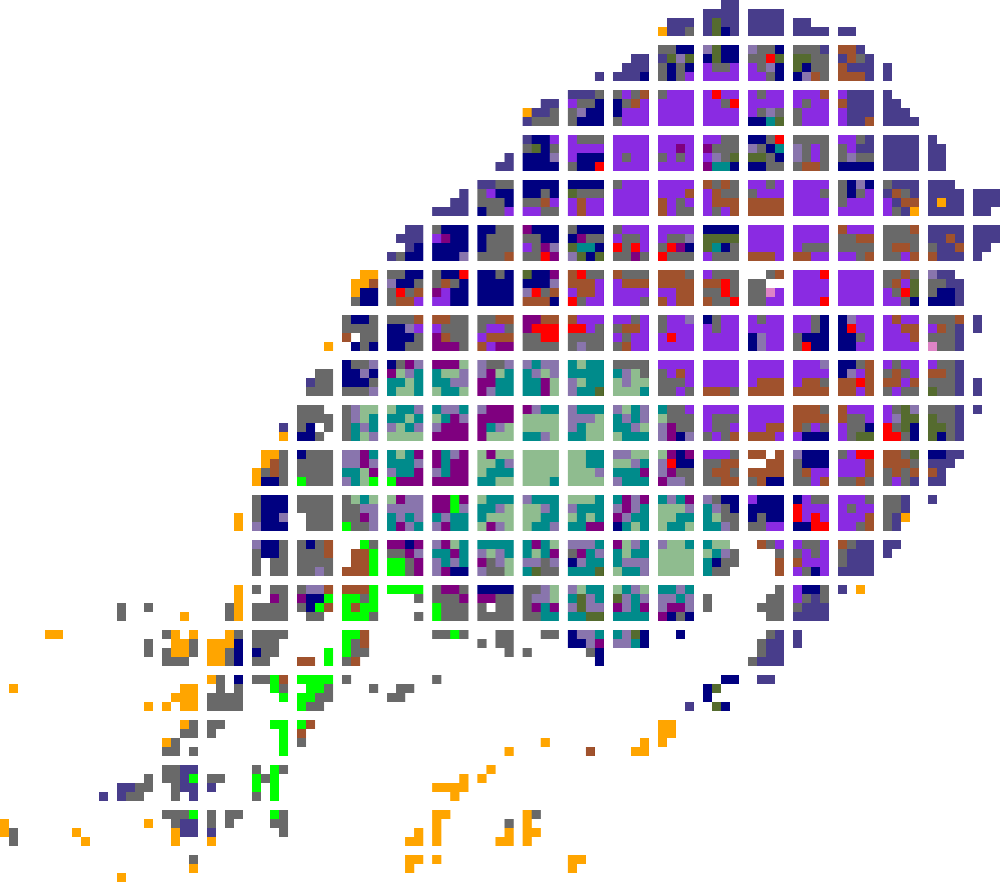

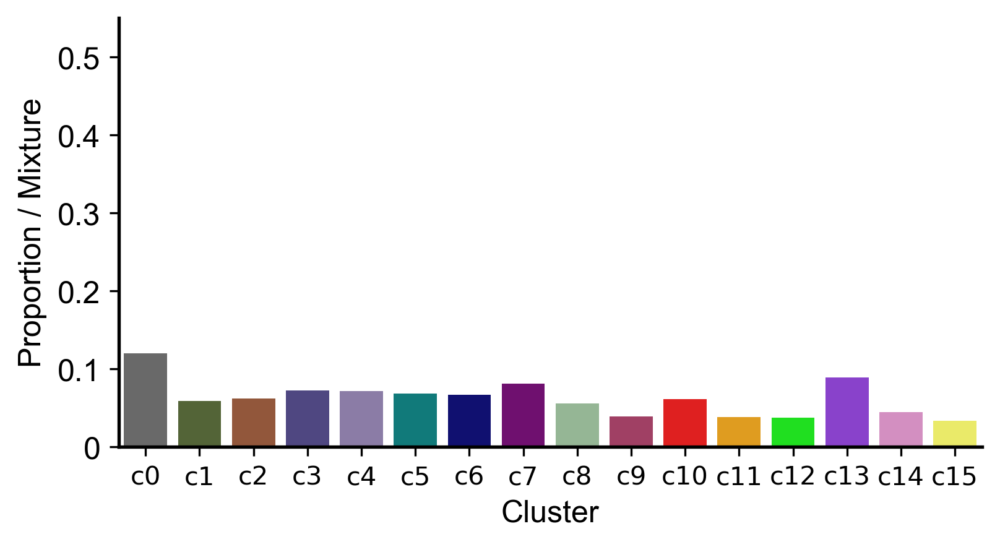

In [3]:
import h5py
import numpy as np
from PIL import Image, ImageDraw
from prototype_visualization_utils import get_default_cmap


h5_feats_fpath = r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_10x\uniextracted_mag10x_patch224_fp\feats_h5\PT 41 B.h5'
# h5_feats_fpath = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 57B.h5'
# h5_feats_fpath = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\unifiltextracted_mag5x_patch224_fp\feats_h5\PT 41 B.h5' # annotated
# h5_feats_fpath = r'C:/Users/Vivian/Documents/CLAM/CLAM/FEATURES_DIR_5x/FEATURES_DIR_2.5x/uniextracted_mag2x_patch224_fp/feats_h5/FA 47 B1.h5' # 2.5x uni
# h5_feats_fpath = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\multiscale\uniextracted_mag2x_patch224_fp\feats_h5\FA 67 B.h5'
# h5_feats_fpath=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\multiscale\52\uniextracted_mag52x_patch224_fp\feats_h5_5x_aligned\PT 41 B.h5'

h5 = h5py.File(h5_feats_fpath, 'r')

coords = h5['coords'][:]
feats = torch.Tensor(h5['features'][:])
print("Features shape:", feats.shape)  # Debugging

# patch_size = h5['coords'].attrs['patch_size']
patch_size = 224

### get PANTHER representation and GMM mixtures
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(dim=0))

    # print(info.keys()) # debugging
    qqs = info['qq']
    out = info['repr']
    print("Mixture probabilities for first 5 patches:\n", qqs[0, :5, :, 0])
    # print("Output representation shape:", out.shape)  # Debugging
    # print("qqs.shape:", qqs.shape)  # Debugging
    # print("out.shape:", out.shape)  # Debugging
    # print("qqs:", qqs[:10]) # debugging
    tokenizer = PrototypeTokenizer(out_type='allcat', p=16)
    mus, pis, sigmas = tokenizer.forward(out)
    # print size of pis
    # print("pis.shape:", pis.shape)  # Debugging
    # pi is pis.shape: torch.Size([1, 16, 1024]) 
    # print first 5 pis
    # print("Mixture probabilities (pis) for first 5 patches:\n", pis[0, :5, 0])

    # print("Mixture probabilities (pis) for first 5 patches after tokenizer:\n", pis[0, :5, :, 0])
    # print("mus.shape:", mus.shape)  # Debugging
    # print("qqs.shape:", qqs.shape)  # Debugging
    # print('sigmas.shape:', sigmas.shape)  # Debugging

    mus = mus[0].detach().cpu().numpy()
    qq = qqs[0,:,:,0].cpu().numpy()
    print(qq.shape)  # Debugging
    print("qq:", qq[:10])  # Debugging
    global_cluster_labels = qq.argmax(axis=1)

# Get bounding box of full patch region
x_min, y_min = coords.min(axis=0)
coords -= np.array([x_min, y_min])  # Normalize to (0,0)
max_x, max_y = coords.max(axis=0) + patch_size
canvas_w, canvas_h = int(max_x), int(max_y)

# Create blank white canvas
canvas = Image.new('RGBA', (canvas_w, canvas_h), (255, 255, 255, 255))
draw = ImageDraw.Draw(canvas, 'RGBA')

# cmap = get_default_cmap(len(np.unique(global_cluster_labels)))
cmap = get_default_cmap(int(global_cluster_labels.max()) + 1)

alpha = 1
scale = 0.25  # Adjust as needed

# Draw rectangles
for (x, y), label in zip(coords, global_cluster_labels):
    color = cmap[label]
    rgba = color + (int(255 * alpha),)  # Add alpha
    draw.rectangle([x, y, x + patch_size, y + patch_size], fill=rgba)

# Resize for visualization
if scale < 1.0:
    canvas = canvas.resize((int(canvas_w * scale), int(canvas_h * scale)))
display(canvas)
display(get_mixture_plot(mus))


=== map_em called ===

=== mog_eval called ===
Input data norms: 1.000 to 1.000

Prototype norms: 1.000 ± 0.000
Covariance range: 0.100 to 0.100

[DEBUG qq] first 5 patches (batch 0):
tensor([[0.0259, 0.0107, 0.0109, 0.0091, 0.0163, 0.0157, 0.0107, 0.0148, 0.0162,
         0.6978, 0.0162, 0.0189, 0.0088, 0.0093, 0.0980, 0.0208],
        [0.0176, 0.0082, 0.0098, 0.0083, 0.0159, 0.0102, 0.0107, 0.0151, 0.0176,
         0.7965, 0.0153, 0.0137, 0.0073, 0.0078, 0.0284, 0.0176],
        [0.0156, 0.0119, 0.0170, 0.0174, 0.0251, 0.0137, 0.0286, 0.0139, 0.0217,
         0.6667, 0.0444, 0.0124, 0.0187, 0.0189, 0.0341, 0.0398],
        [0.0458, 0.0178, 0.0242, 0.0228, 0.0340, 0.0202, 0.0278, 0.0224, 0.0345,
         0.2886, 0.0438, 0.0222, 0.0222, 0.0237, 0.2881, 0.0619],
        [0.0308, 0.0174, 0.0259, 0.0303, 0.0413, 0.0199, 0.0475, 0.0192, 0.0385,
         0.4225, 0.0869, 0.0181, 0.0334, 0.0358, 0.0446, 0.0879]])
[DEBUG qq] row sums ≈ 1: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000])
[DEBU

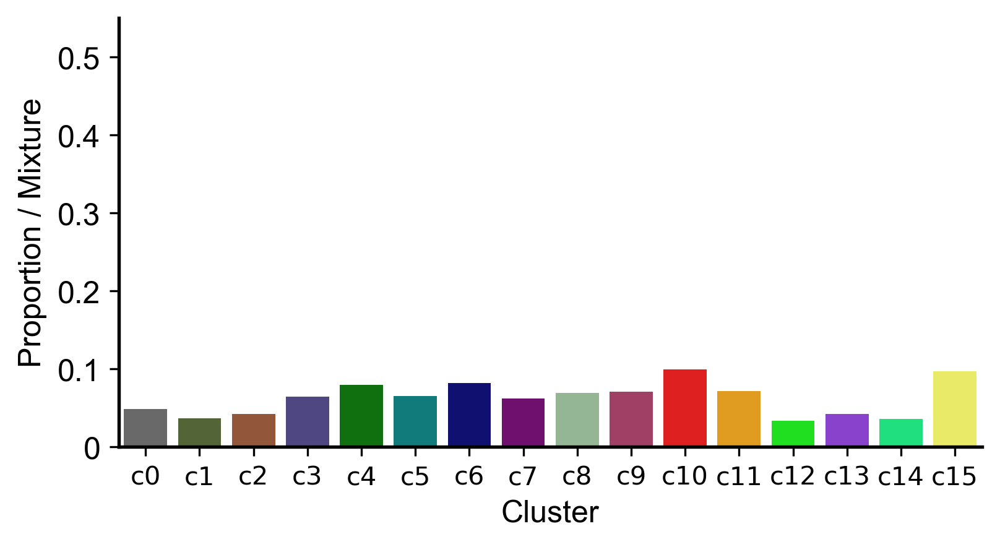

In [3]:
import h5py
import numpy as np
from PIL import Image, ImageDraw
from prototype_visualization_utils import get_default_cmap


h5_feats_fpath = r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_10x\uniextracted_mag10x_patch224_fp\feats_h5\PT 41 B.h5'
# h5_feats_fpath = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 57B.h5'

h5 = h5py.File(h5_feats_fpath, 'r')

coords = h5['coords'][:]
feats = torch.Tensor(h5['features'][:])

# patch_size = h5['coords'].attrs['patch_size']
patch_size = 224

### get PANTHER representation and GMM mixtures
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(dim=0))

    # print(info.keys()) # debugging
    qqs = info['qq']
    print("qqs shape first:", qqs.shape)  # Debugging

    out = info['repr']
    print("Output representation shape:", out.shape)  # Debugging
    # print("Mixture probabilities for first 5 patches:\n", qqs[0, :5, :, 0])

    tokenizer = PrototypeTokenizer(out_type='allcat', p=16)
    mus, pis, sigmas = tokenizer.forward(out)
    print('sigmas shape:', sigmas.shape)  # Debugging
    print('pis shape:', pis.shape)  # Debugging
    # pi shape pis shape: torch.Size([1, 16, 1024])
    # print first 5 pis
    print("Mixture probabilities (pis) for first 5 patches:\n", pis[0, :1, :])
    print("mus:", mus)  # Debugging
    print('mus shape:', mus.shape)  # Debugging
    mus = mus[0].detach().cpu().numpy()
    qq = qqs[0,:,:,0].cpu().numpy()
    print(qq.shape)  # Debugging
    # print("qq:", qq[:10])  # Debugging
    global_cluster_labels = qq.argmax(axis=1)

display(get_mixture_plot(mus))

tsne

In [ ]:
import pickle
import umap
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------
# 1. Load and prepare your data (your existing code)
# -----------------------------
import pickle
import umap  # Make sure this is imported

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# -----------------------------
# Settings
# -----------------------------
# h5_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5'
h5_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\multiscale\52\uniextracted_mag52x_patch224_fp\feats_h5_5x_aligned' # multiscale
label_map = {'FA': 0, 'PT': 1}  # Map based on prefix in filename
max_patches_per_slide = 200  # Optionally limit patches per slide to balance

# -----------------------------
# Load all features, labels, slide IDs
# -----------------------------
all_features = []
all_labels = []
slide_ids = []

for fname in os.listdir(h5_dir):
    if not fname.endswith('.h5'):
        continue

    label_str = fname.split()[0]  # e.g., 'FA' from 'FA 47 B1.h5'
    label = label_map.get(label_str, None)
    if label is None:
        continue

    slide_id = fname.replace('.h5', '')

    with h5py.File(os.path.join(h5_dir, fname), 'r') as f:
        feats = f['features'][:]
        
        # Normalize patch features to unit norm (along feature dimension) 🔽
        # feats = feats / (np.linalg.norm(feats, axis=1, keepdims=True) + 1e-6)
        # ------------------------------------------------------------

        # # Limit number of patches per slide
        # if len(feats) > max_patches_per_slide:
        #     idx = np.random.choice(len(feats), max_patches_per_slide, replace=False)
        #     feats = feats[idx]
        
        all_features.append(feats)
        all_labels.extend([label] * len(feats))
        slide_ids.extend([slide_id] * len(feats))  # 👈 Add slide_id per patch

# Stack everything
all_features = np.vstack(all_features)
all_labels = np.array(all_labels)
slide_ids = np.array(slide_ids)

print(f"Total patches: {len(all_labels)}")
print(f"Feature shape: {all_features.shape}")  # (N, 1024)
# print(f"Unique slide IDs: {np.unique(slide_ids)}")


# -----------------------------
# 2. Load and prepare prototypes
# -----------------------------
# prototype_pkl_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_5x_norm2_k=0\prototypes\prototypes_c16_uniextracted_mag5x_patch224_fp_kmeans_num_1.0e+06.pkl'  # normalized prototypes
# prototype_pkl_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_k=0\prototypes\prototypes_c16_uni_kmeans_num_1.0e+06.pkl' # not normalized prototypes
# prototype_pkl_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\multiscale\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag2x_patch224_fp_kmeans_num_4.0e+05.pkl' # multiscale prototypes
prototype_pkl_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\multiscale\52\FA_PT_k=0\prototypes\prototypes_c16_uniextracted_mag52_patch224_fp_kmeans_num_4.0e+05.pkl'
with open(prototype_pkl_path, 'rb') as f:
    prototype_data = pickle.load(f)
    
prototype_centroids = prototype_data['prototypes']  # Shape (1, 16, 1024)

# Reshape prototypes to (16, 1024)
prototype_centroids = prototype_centroids.reshape(-1, prototype_centroids.shape[-1])
print(f"Prototypes shape after reshaping: {prototype_centroids.shape}")

# -----------------------------
# 3. Create UMAP embedding
# # -----------------------------
# reducer = umap.UMAP(n_components=2, random_state=42)

# # Fit on ALL data (original features + prototypes)
# combined_features = np.vstack([all_features, prototype_centroids])
# combined_2d = reducer.fit_transform(combined_features)

# # Split back into original and prototypes
# features_2d = combined_2d[:-len(prototype_centroids)]  # Original points
# prototypes_2d = combined_2d[-len(prototype_centroids):]  # Prototypes

from sklearn.manifold import TSNE

# -----------------------------
# 3. Create t-SNE embedding (alternative to UMAP)
# -----------------------------
# First combine all features and prototypes
combined_features = np.vstack([all_features, prototype_centroids])

# Create t-SNE embedding (perplexity can be adjusted)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
combined_2d = tsne.fit_transform(combined_features)

# Split back into original and prototypes
features_2d = combined_2d[:-len(prototype_centroids)]  # Original points
prototypes_2d = combined_2d[-len(prototype_centroids):]  # Prototypes


c:\Users\Vivian\anaconda3\envs\panther\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Total patches: 617252
Feature shape: (617252, 2048)
Prototypes shape after reshaping: (16, 2048)


: 

C:\Users\Vivian\AppData\Local\Temp\ipykernel_37120\2514332516.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(features_2d[is_background, 0],


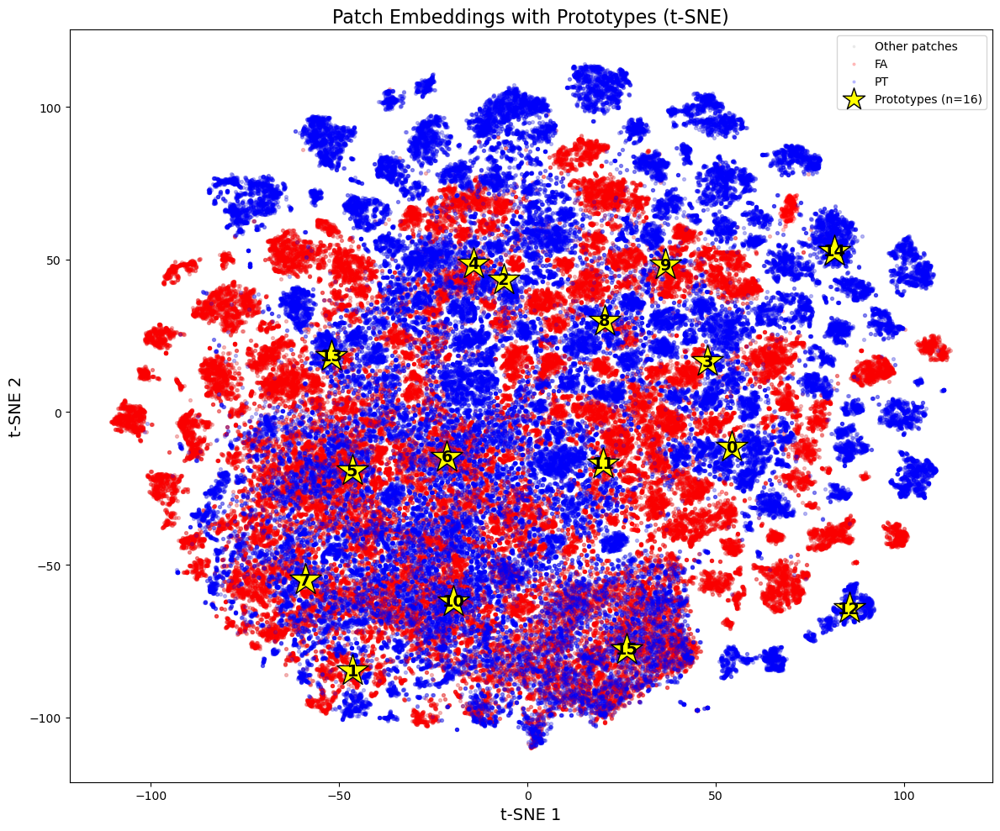

In [3]:
# -----------------------------
# 4. Plotting with highlighted slide and prototypes
# -----------------------------
highlight_slide_id = 'FA 64 B'
is_highlight = slide_ids == highlight_slide_id
is_background = ~is_highlight

plt.figure(figsize=(12, 10))

# Plot background points (light gray)
plt.scatter(features_2d[is_background, 0], 
            features_2d[is_background, 1], 
            c=(0.8, 0.8, 0.8), s=6, alpha=0.3, label='Other patches')

# # Plot highlighted slide points (blue)
# plt.scatter(features_2d[is_highlight, 0], 
#             features_2d[is_highlight, 1], 
#             c=(0.121, 0.466, 0.705), s=10, alpha=0.8, label=f'Slide {highlight_slide_id}')

# plot all fa slides

plt.scatter(features_2d[all_labels == 0, 0], 
            features_2d[all_labels == 0, 1], 
            c='red', s=8, alpha=0.2, label=f'FA')

# plot all pt slides in orange
plt.scatter(features_2d[all_labels == 1, 0],
            features_2d[all_labels == 1, 1],
            c='blue', s=8, alpha=0.2, label='PT')


# Plot prototypes (red stars with black edges)
plt.scatter(prototypes_2d[:, 0], prototypes_2d[:, 1],
            c='yellow', marker='*', s=800, linewidths=1,
            edgecolors='black', label='Prototypes (n=16)')

# Add labels and legend
plt.title("Patch Embeddings with Prototypes (t-SNE)", fontsize=16)
plt.xlabel("t-SNE 1", fontsize=14)
plt.ylabel("t-SNE 2", fontsize=14)
plt.legend(fontsize=10, markerscale=0.7)

# Add numbers to prototypes (starting from 0)
for i, (x, y) in enumerate(prototypes_2d):
    plt.text(x, y, str(i), color='black',  # Changed i+1 to just i
             ha='center', va='center', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


In [10]:
import numpy as np

# -----------------------------
# Settings for your cluster of interest
# -----------------------------
highlight_slide_id = 'FA 57B'
cluster_x_range = (-10, 20)   # Adjust based on visual inspection
cluster_y_range = (-100, -60)

# Get the qq scores (e.g., shape: [N_patches, n_prototypes])
# Load it from your existing panther_encoder.representation output
# e.g. qq = qqs[0, :, :, 0].cpu().numpy()  


# Get patches from the highlighted slide
patch_mask = (slide_ids == highlight_slide_id)
patch_coords_2d = features_2d[patch_mask]
# patch_qq = qq[patch_mask]  # [num_patches_from_slide, num_prototypes]
fa_qq = qq 

# Filter patches in the t-SNE cluster bounding box
in_cluster = (
    (patch_coords_2d[:, 0] >= cluster_x_range[0]) & 
    (patch_coords_2d[:, 0] <= cluster_x_range[1]) &
    (patch_coords_2d[:, 1] >= cluster_y_range[0]) & 
    (patch_coords_2d[:, 1] <= cluster_y_range[1])
)

cluster_qq = fa_qq[in_cluster]

# -----------------------------
# Print prototype assignments for those patches
# -----------------------------
print(f"🔍 Analyzing {cluster_qq.shape[0]} patches in the t-SNE cluster for slide {highlight_slide_id}")
print("Top assignments to c4 and c5:")

for i, row in enumerate(cluster_qq):
    c4_score = row[4]
    c5_score = row[5]
    top_proto = row.argmax()
    top2_proto = row.argsort()[-2]
    print(f"Patch {i}: c4={c4_score:.3f}, c5={c5_score:.3f} | Top-1: c{top_proto}, Top-2: c{top2_proto}")

# -----------------------------
# Optional: summarize average
# -----------------------------
print("\n=== Summary ===")
print(f"Avg c4 score: {cluster_qq[:, 4].mean():.4f}")
print(f"Avg c5 score: {cluster_qq[:, 5].mean():.4f}")


IndexError: boolean index did not match indexed array along dimension 0; dimension is 2137 but corresponding boolean dimension is 200

In [ ]:
import os
import h5py
import torch
import numpy as np
import pandas as pd
from utils.proto_utils import load_pkl
from mil_models.PANTHER.networks import mog_eval
from mil_models.PANTHER.networks import DirNIWNet

# ---------------------------
# User settings
# ---------------------------
h5_feats_fpath = r"C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\PT 41 B.h5"
# proto_path     = r"C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_k=0\prototypes\prototypes_c16_uni_kmeans_num_1.0e+06.pkl"
proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_5x_norm2_k=0\prototypes\prototypes_c16_uniextracted_mag5x_patch224_fp_kmeans_num_1.0e+06.pkl' # norm
output_csv     = "soft_assignments3_PT_41_B.csv"
p              = 16       # number of prototypes
d              = 1024     # feature dimension
eps            = 0.1      # covariance epsilon

# ---------------------------
# Load patch features & coords
# ---------------------------
with h5py.File(h5_feats_fpath, "r") as h5:
    coords = h5["coords"][:]           # shape [num_patches, 2]
    feats = torch.tensor(h5["features"][:], dtype=torch.float32)  # shape [num_patches, d]

print(f"Loaded {feats.shape[0]} patches with dim {feats.shape[1]}")

# ---------------------------
# Load prototypes
# ---------------------------
if proto_path.endswith(".pkl"):
    weights = load_pkl(proto_path)["prototypes"].squeeze()
elif proto_path.endswith(".npy"):
    weights = np.load(proto_path)
else:
    raise ValueError("Unsupported prototype file format")

weights = torch.tensor(weights, dtype=torch.float32)  # shape [p, d]

# ---------------------------
# Initialize DirNIWNet to match prototypes
# ---------------------------
proto_model = DirNIWNet(p, d, eps=eps, load_proto=False, fix_proto=True)
proto_model.m.data = weights.clone()  # set means
proto_model.V_.data = torch.log(torch.exp(torch.ones((p, d))) - 1)  # default covariances

# ---------------------------
# Get priors (π, μ, Σ)
# ---------------------------
pi, mu, Sigma = proto_model.mode()
pi   = pi.unsqueeze(0)    # [1, p]
mu   = mu.unsqueeze(0)    # [1, p, d]
Sigma= Sigma.unsqueeze(0) # [1, p, d]

# ---------------------------
# Get soft assignments from mog_eval (no EM)
# ---------------------------
with torch.inference_mode():
    _, log_resp, _ = mog_eval((pi, mu, Sigma), feats.unsqueeze(0))  # [1, N, p] in log-space
    temperature = 5.0  # try 3, 5, 10
    soft_probs = torch.softmax(log_qq / temperature, dim=-1)

    # soft_probs = torch.softmax(log_resp, dim=-1)  # [1, N, p]

soft_probs = soft_probs.squeeze(0).cpu().numpy()

print("Soft probs shape:", soft_probs.shape)
print("First patch soft probs:", soft_probs[0])

# ---------------------------
# Save to CSV
# ---------------------------
df = pd.DataFrame(coords, columns=["x", "y"])
for i in range(p):
    df[f"proto_{i}"] = soft_probs[:, i]

df.to_csv(output_csv, index=False)
print(f"Saved soft assignments to {output_csv}")


visualize patches per cluster

In [ ]:
from collections import defaultdict
import random

cluster_to_coords = defaultdict(list)
for coord, label in zip(coords, global_cluster_labels):
    cluster_to_coords[label].append(coord)


with randomized selection of patches

In [4]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import torch
from prototype_visualization_utils import get_default_cmap
from mil_models.tokenizer import PrototypeTokenizer
import glob
import random

def visualize_cluster_patches_for_slide(
    h5_feats_fpath,
    patch_dir,
    panther_encoder,
    patch_size=224,
    max_patches_per_cluster=4,
    random_seed=None,
    save_path=None
):
    """
    Visualizes a few random patch examples from each prototype cluster for a single slide.

    Parameters:
    - h5_feats_fpath (str): path to the .h5 file with 'features' and 'coords'.
    - patch_dir (str): path to the directory containing .npy patches for the slide.
    - panther_encoder (torch.nn.Module): trained encoder that returns representation and qq.
    - patch_size (int): size of each square patch.
    - max_patches_per_cluster (int): number of patches to show per cluster.
    - random_seed (int or None): seed for reproducibility.
    - save_path (str or None): path to save the final image (optional).
    """
    if random_seed is not None:
        random.seed(random_seed)

    with h5py.File(h5_feats_fpath, 'r') as h5:
        coords = h5['coords'][:]
        feats = torch.Tensor(h5['features'][:])

    with torch.inference_mode():
        info = panther_encoder.representation(feats.unsqueeze(dim=0))
        qqs = info['qq']
        out = info['repr']
        tokenizer = PrototypeTokenizer(out_type='allcat', p=qqs.shape[2])
        tokenizer.forward(out)  # Optional
        qq = qqs[0, :, :, 0].cpu().numpy()
        global_cluster_labels = qq.argmax(axis=1)

    original_coords = coords.copy()
    samples_per_cluster = {}
    for label, (x, y) in zip(global_cluster_labels, original_coords):
        samples_per_cluster.setdefault(label, []).append((int(x), int(y)))

    n_clusters = len(samples_per_cluster)
    fig, axs = plt.subplots(n_clusters, max_patches_per_cluster, figsize=(max_patches_per_cluster * 3, n_clusters * 3))
    if n_clusters == 1:
        axs = np.expand_dims(axs, axis=0)

    # for row_idx, (cluster_id, coords_list) in enumerate(samples_per_cluster.items()):
    for row_idx, cluster_id in enumerate(sorted(samples_per_cluster.keys())):
        coords_list = samples_per_cluster[cluster_id]

        selected_coords = random.sample(coords_list, k=min(max_patches_per_cluster, len(coords_list)))
        for col_idx in range(max_patches_per_cluster):
        # for col_idx in range(max_patches_per_cluster): # not randomized
            ax = axs[row_idx][col_idx]
            if col_idx >= len(selected_coords):
                ax.axis('off')
                continue

            x, y = selected_coords[col_idx]
            pattern = f'*_x{x}_y{y}.npy'
            matches = glob.glob(os.path.join(patch_dir, pattern))

            if not matches:
                print(f"⚠️ Missing patch ending with _x{x}_y{y}.npy")
                ax.axis('off')
                continue

            patch = np.load(matches[0])
            ax.imshow(patch.astype(np.uint8))
            ax.set_title(f'Cluster {cluster_id}' if col_idx == 0 else "")
            ax.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()



=== map_em called ===

=== mog_eval called ===
Input data norms: 1.000 to 1.000

Prototype norms: 1.000 ± 0.000
Covariance range: 0.100 to 0.100

[DEBUG qq] first 5 patches (batch 0):
tensor([[0.0233, 0.0191, 0.0088, 0.6728, 0.0152, 0.0190, 0.0170, 0.0181, 0.0158,
         0.0100, 0.0128, 0.1121, 0.0253, 0.0112, 0.0102, 0.0093],
        [0.0207, 0.0137, 0.0087, 0.7775, 0.0170, 0.0147, 0.0120, 0.0191, 0.0182,
         0.0084, 0.0124, 0.0322, 0.0171, 0.0122, 0.0091, 0.0073],
        [0.0538, 0.0182, 0.0162, 0.6621, 0.0172, 0.0108, 0.0140, 0.0268, 0.0194,
         0.0229, 0.0243, 0.0376, 0.0129, 0.0316, 0.0208, 0.0113],
        [0.0649, 0.0254, 0.0209, 0.2760, 0.0261, 0.0209, 0.0200, 0.0487, 0.0261,
         0.0250, 0.0292, 0.3060, 0.0419, 0.0274, 0.0250, 0.0166],
        [0.1161, 0.0242, 0.0274, 0.4332, 0.0250, 0.0151, 0.0195, 0.0509, 0.0313,
         0.0397, 0.0409, 0.0471, 0.0240, 0.0514, 0.0377, 0.0165]])
[DEBUG qq] row sums ≈ 1: tensor([1.0000, 1.0000, 1.0000, 1.0000, 1.0000])
[DEBU

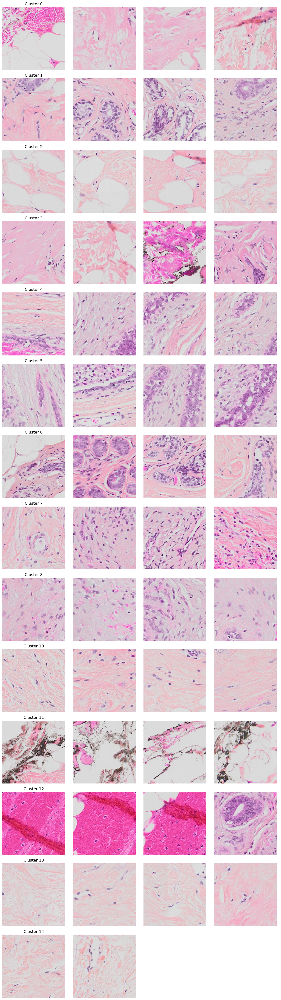

In [5]:
visualize_cluster_patches_for_slide(
    # h5_feats_fpath=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\multiscale\52\uniextracted_mag52x_patch224_fp\feats_h5_5x_aligned\FA 64 B.h5',
    # h5_feats_fpath=r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5\FA 47 B1.h5',
    # h5_feats_fpath=r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_2.5x\uniextracted_mag2x_patch224_fp\feats_h5\FA 64 B.h5',
    h5_feats_fpath=r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_10x\uniextracted_mag10x_patch224_fp\feats_h5\PT 41 B.h5',
    # patch_dir=r'C:\Users\Vivian\Documents\CONCH\all_patches\patches_5x\20x\FA\FA 64 B',
    # patch_dir=r'C:\Users\Vivian\Documents\CONCH\all_patches\patches_2.5x\20x\PT\PT 40 B',
    # patch_dir=r'C:\Users\Vivian\Documents\CONCH\all_patches\patches_2.5x\20x\FA\FA 63 B',
    patch_dir=r'C:\Users\Vivian\Documents\CONCH\patches_tiled\patches_10x\20x\PT\PT 41 B',
    panther_encoder=panther_encoder,
    patch_size=224,
    max_patches_per_cluster=4,
    random_seed=42  # or set a seed like 42 if needed
)


inspect qq

In [ ]:
import os
import h5py
import numpy as np
import torch

def inspect_qq_scores(slide_id, h5_dir, panther_encoder, top_k=5):
    """
    Prints the prototype soft assignment (qq) scores for patches in a given slide.

    Args:
        slide_id (str): Slide ID (e.g. 'PT 41 B').
        h5_dir (str): Directory containing .h5 feature files.
        panther_encoder (nn.Module): Loaded Panther encoder model.
        top_k (int): Number of top patches (by max qq) to display.
    """
    # Build H5 path
    h5_path = os.path.join(h5_dir, f"{slide_id}.h5")
    if not os.path.isfile(h5_path):
        print(f"❌ H5 file not found: {h5_path}")
        return

    # Load features and coords
    with h5py.File(h5_path, 'r') as h5:
        feats = torch.tensor(h5['features'][:])  # [N, D]

        # attempting to normalize features
        feats = feats / (torch.norm(feats, dim=1, keepdim=True) + 1e-6)  # Normalize to unit length
        print("Normalized feature norms:", torch.norm(feats, dim=1).min(), torch.norm(feats, dim=1).max())
        coords = h5['coords'][:]                 # [N, 2]

    print(f"✅ Loaded {feats.shape[0]} patches from {slide_id}")

    # Run Panther encoder to get qq
    with torch.inference_mode():
        info = panther_encoder.representation(feats.unsqueeze(0))
        qq = info['qq'][0, :, :, 0].cpu().numpy()  # shape: [N_patches, n_prototypes]

    print(f"qq shape: {qq.shape}")
    print(f"Prototype softmax scores for first {top_k} patches:")

    # Check top_k patches with their max score and full row
    for i in range(min(top_k, len(qq))):
        patch_scores = qq[i]
        max_score = patch_scores.max()
        proto = patch_scores.argmax()
        coord = coords[i]
        print(f"Patch {i} @ coord {tuple(coord)} → max proto: {proto}, max score: {max_score:.4f}, full: {np.round(patch_scores, 3)}")

    # Check if any patch has all 1.0
    suspicious = np.where(np.all(qq == 1.0, axis=1))[0]
    if len(suspicious) > 0:
        print(f"⚠️ {len(suspicious)} patches have qq scores all equal to 1.0 (possible bug).")



In [ ]:
# Example usage
slide_id = 'PT 41 B'
h5_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\features\uniextracted_mag5x_patch224_fp\feats_h5'
inspect_qq_scores(slide_id, h5_dir, panther_encoder)

Normalized feature norms: tensor(1.0000) tensor(1.0000)
✅ Loaded 1195 patches from PT 41 B

=== map_em called ===

=== mog_eval called ===
Input data norms: 1.000 to 1.000

Prototype norms: 1.000 ± 0.000
Covariance range: 0.100 to 0.100
[PANTHER] Mean soft assignment entropy: 2.6710
qq shape: (1195, 16)
Prototype softmax scores for first 5 patches:
Patch 0 @ coord (8960, 0) → max proto: 13, max score: 0.7889, full: [0.008 0.008 0.007 0.014 0.012 0.012 0.005 0.018 0.019 0.015 0.008 0.017
 0.014 0.789 0.034 0.021]
Patch 1 @ coord (9184, 0) → max proto: 13, max score: 0.8022, full: [0.006 0.005 0.005 0.008 0.008 0.009 0.006 0.021 0.013 0.01  0.008 0.01
 0.007 0.802 0.066 0.017]
Patch 2 @ coord (9408, 0) → max proto: 13, max score: 0.4096, full: [0.013 0.012 0.013 0.016 0.018 0.053 0.029 0.097 0.033 0.018 0.026 0.017
 0.02  0.41  0.193 0.031]
Patch 3 @ coord (9632, 0) → max proto: 13, max score: 0.5358, full: [0.012 0.012 0.01  0.02  0.015 0.021 0.016 0.075 0.034 0.016 0.016 0.018
 0.02  0

In [ ]:
def visualize_top_k_patches_per_prototype_from_qq(
    h5_feats_fpath,
    patch_dir,
    panther_encoder,
    top_k=4,
    patch_size=224,
    save_path=None
):
    import glob
    import matplotlib.pyplot as plt
    import numpy as np
    import torch
    import h5py
    import os

    # Load patch-level features
    with h5py.File(h5_feats_fpath, 'r') as h5:
        coords = h5['coords'][:]
        feats = torch.Tensor(h5['features'][:])

    with torch.inference_mode():
        info = panther_encoder.representation(feats.unsqueeze(0))
        qq = info['qq'][0, :, :, 0].cpu().numpy()  # shape: (N, p)

    n_patches, n_protos = qq.shape

    # Select top-k patches per prototype based on qq soft assignments
    proto_to_indices = {
        proto: np.argsort(-qq[:, proto])[:top_k] for proto in range(n_protos)
    }

    # Plot
    fig, axs = plt.subplots(n_protos, top_k, figsize=(top_k * 3, n_protos * 3))
    if n_protos == 1:
        axs = np.expand_dims(axs, axis=0)

    for proto_idx in range(n_protos):
        for k in range(top_k):
            ax = axs[proto_idx, k]
            patch_idx = proto_to_indices[proto_idx][k]
            x, y = coords[patch_idx]

            pattern = f'*_x{int(x)}_y{int(y)}.npy'
            matches = glob.glob(os.path.join(patch_dir, pattern))
            if not matches:
                ax.axis('off')
                continue

            patch = np.load(matches[0])
            ax.imshow(patch.astype(np.uint8))
            if k == 0:
                ax.set_title(f'Proto {proto_idx}')
            ax.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()


using qq to visualize top k patches

In [ ]:
def visualize_top_k_patches_per_prototype_from_qq(
    h5_feats_fpath,
    patch_dir,
    panther_encoder,
    top_k=4,
    patch_size=224,
    save_path=None
):
    import glob
    import matplotlib.pyplot as plt
    import numpy as np
    import torch
    import h5py
    import os

    # Load patch-level features
    with h5py.File(h5_feats_fpath, 'r') as h5:
        coords = h5['coords'][:]
        feats = torch.Tensor(h5['features'][:])

    # Get prototype assignments
    with torch.inference_mode():
        info = panther_encoder.representation(feats.unsqueeze(0))
        qq = info['qq'][0, :, :, 0].cpu().numpy()  # shape: (N, p)

    n_patches, n_protos = qq.shape

    # Select top-k patches per prototype (skip inactive prototypes)
    proto_to_indices = {}
    for proto in range(n_protos):
        proto_scores = qq[:, proto]
        if np.max(proto_scores) < 1e-5:  # Skip prototypes with no significant activation
            continue

        nonzero_indices = np.where(proto_scores > 1e-3)[0]
        if len(nonzero_indices) == 0:
            continue

        sorted_indices = nonzero_indices[np.argsort(-proto_scores[nonzero_indices])]
        proto_to_indices[proto] = sorted_indices[:top_k]

    active_protos = sorted(proto_to_indices.keys())
    if len(active_protos) == 0:
        print("⚠️ No active prototypes found in this slide.")
        return

    # Plotting
    fig, axs = plt.subplots(len(active_protos), top_k, figsize=(top_k * 3, len(active_protos) * 3))
    if len(active_protos) == 1:
        axs = np.expand_dims(axs, axis=0)

    for row_idx, proto_idx in enumerate(active_protos):
        indices = proto_to_indices[proto_idx]
        for col_idx in range(top_k):
            ax = axs[row_idx, col_idx]
            if col_idx >= len(indices):
                ax.axis('off')
                continue

            patch_idx = indices[col_idx]
            x, y = coords[patch_idx]

            pattern = f'*_x{int(x)}_y{int(y)}.npy'
            matches = glob.glob(os.path.join(patch_dir, pattern))
            if not matches:
                ax.axis('off')
                continue

            patch = np.load(matches[0])
            ax.imshow(patch.astype(np.uint8))
            if col_idx == 0:
                ax.set_title(f'Proto {proto_idx}')
            ax.axis('off')

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:
h5_feats_fpath=r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_2.5x\uniextracted_mag2x_patch224_fp\feats_h5\PT 41 B.h5'
patch_dir=r'C:\Users\Vivian\Documents\CONCH\all_patches\patches_2.5x\20x\PT\PT 41 B'
    
visualize_top_k_patches_per_prototype_from_qq(
    h5_feats_fpath=h5_feats_fpath,
    patch_dir=patch_dir,
    panther_encoder=panther_encoder,
    top_k=4,
    patch_size=224,
    save_path=None
)

In [ ]:
import torch
import h5py
import numpy as np
import os
from mil_models.model_factory import create_downstream_model
from prototype_visualization_utils import get_panther_encoder

# --- Setup ---
slide_path = r'C:\Users\Vivian\Documents\CLAM\CLAM\FEATURES_DIR_5x\FEATURES_DIR_2.5x\uniextracted_mag2x_patch224_fp\feats_h5\FA 74 B.h5'
proto_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\splits\FA_PT_2.5x_k=0\prototypes\prototypes_c16_uniextracted_mag2.5x_patch224_fp_kmeans_num_1.0e+06.pkl'
ckpt_path = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\results\fa_vs_pt\k=0\FA_PT_2.5x_panther\FA_PT_2.5x_panther--25-07-21-17-04-49\s_checkpoint.pth'
config_dir = r'C:\Users\Vivian\Documents\PANTHER\PANTHER\src\configs'

# Step 1: Load PANTHER encoder to get prototype assignments
panther_encoder = get_panther_encoder(
    in_dim=1024,
    p=16,
    proto_path=proto_path,
    config_dir=config_dir,
    model_config='PANTHER_fa_pt',
    out_type='allcat'
)

# Step 2: Load downstream LinearEmb model
class Args:
    in_dim = 16  # Number of prototypes
    out_type = 'allcat'
    out_size = 32784
    n_classes = 2
    model_type = 'LinearEmb'
    model_config = 'LinearEmb'

args = Args()
model = create_downstream_model(args, mode='classification', config_dir=config_dir)
model.load_state_dict(torch.load(ckpt_path, map_location='cpu'))
model.eval()

# Step 3: Load patch-level features
with h5py.File(slide_path, 'r') as f:
    feats = torch.tensor(f['features'][:])  # (N_patches, 1024)

# Step 4: Get prototype assignments per patch
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(0))  # Add batch dim
    q = info['qq'][0, :, :, 0]  # shape: (N_patches, n_prototypes)

# Step 5: Run each patch's prototype vector through the classifier
with torch.no_grad():
    logits = model(q)  # (N_patches, n_classes)
    probs = torch.softmax(logits, dim=1)
    preds = torch.argmax(probs, dim=1)

# --- Output ---
print(f"Patch-level predictions: {preds.numpy()}")
print(f"Probabilities (first 5):\n{probs[:5].numpy()}")



og code to visualize heatmap on wsi


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (103598, 86210)
Width: 3237, Height: 2694
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]
vis_level:  2
downsample:  32
region_size:  (3237, 2694)
total of 22312 patches


100%|██████████| 22312/22312 [00:01<00:00, 14284.04it/s]


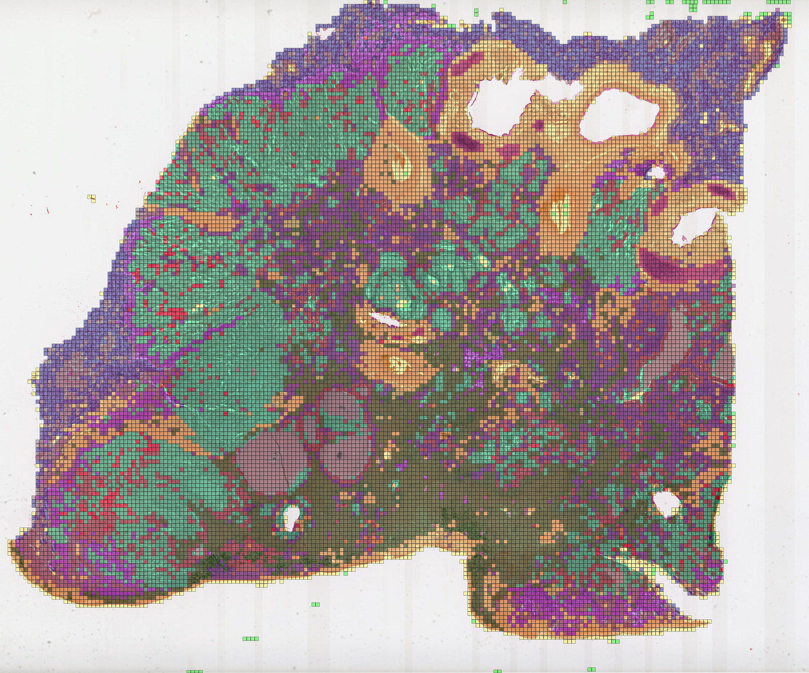

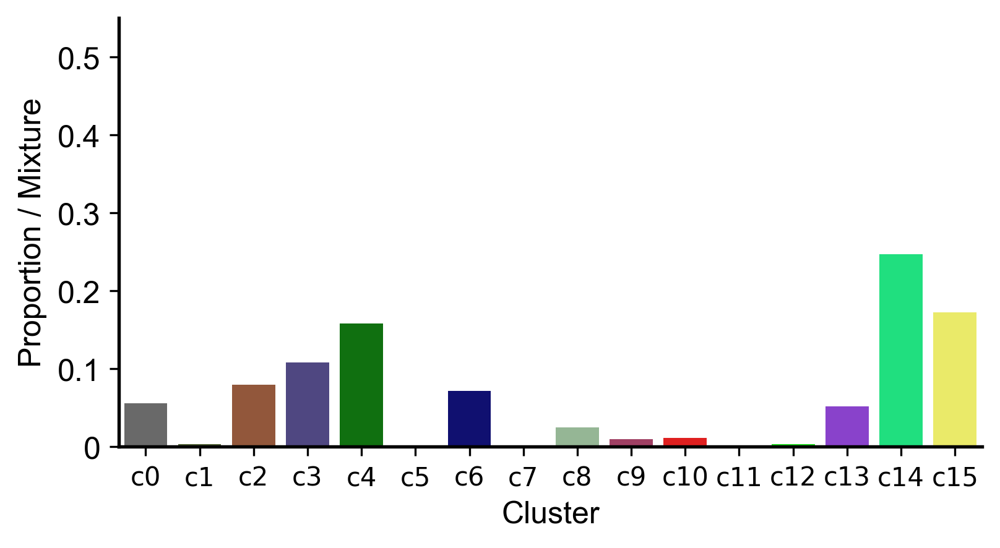

None

In [ ]:
### open your WSI and features
slide_id = 'TCGA-93-8067-01Z-00-DX1.325d0cd5-9bb5-4f51-a197-75d3c3d19aaf'
slide_fpath = f'path/to/tcga_lung/{slide_id}.svs'
h5_feats_fpath = f'path/to/tcga_lung_feats/{slide_id}.h5'

wsi = openslide.open_slide(slide_fpath)
h5 = h5py.File(h5_feats_fpath, 'r')

coords = h5['coords'][:]
feats = torch.Tensor(h5['features'][:])
patch_size = h5['coords'].attrs['patch_size']

### get PANTHER representation and GMM mixtures
with torch.inference_mode():
    info = panther_encoder.representation(feats.unsqueeze(dim=0))
    qqs = info['qq']
    out = info['repr']
    tokenizer = PrototypeTokenizer(p=16)
    mus, pis, sigmas = tokenizer.forward(out)
    mus = mus[0].detach().cpu().numpy()
    qq = qqs[0,:,:,0].cpu().numpy()
    global_cluster_labels = qq.argmax(axis=1)

### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    global_cluster_labels, 
    label2color_dict=get_default_cmap(16),
    vis_level=wsi.get_best_level_for_downsample(128),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

display(cat_map.resize((cat_map.width//4, cat_map.height//4)))
display(get_mixture_plot(mus))

### Additional Examples of Prototypical Assignment Maps
- Shown below are additional examples of prototypical assignment maps in the test set of the NSCLC subtyping task. We show both exemplar and failure cases in PANTHER. Within `./tcga_lung_categorical_maps.zip` are visualizations for all test TCGA WSIs in the NSCLC subtyping task.
- **Limitations**: As unsupervised slide representations in PANTHER are created using non-parametric techniques such as K-Means Clustering and GMMs (which rely on Euclidean distance or dot product to compare embeddings), dependent on the severity of distribution shift between the train and test distributions (due to variable H&E stain variability), prototype assignment for certain WSIs may lead to results in which all patches are assigned to a single prototype. This is exemplified in TCGA which has site-specific biases, and is thus an important consideration when considering using PANTHER (or any non-parametric approach) for morphological feature discovery. Additionally, when clustering over a WSI dataset composed of millions to billions of patches, wclustering with only C=16 clusters will likely underfit the dataset, and also lead to collapse of all patches in a WSI falling under a single prototype.

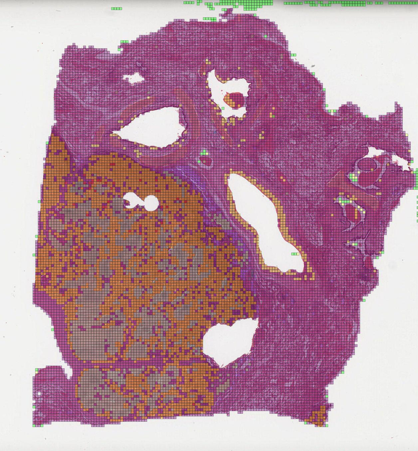

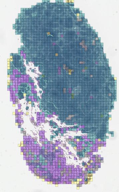

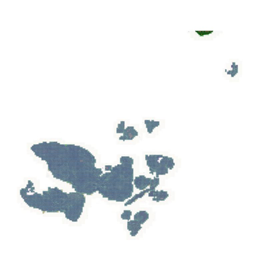